# Этап 0
## Загрузка датасета ogyeiv2
Датасет предоставлен венгерским Национальным институтом фармации и питания (OGYEI). Датасет содержит изображения 112 разных таблеток, снятые на однотонном фоне с разными типами освещения и положением таблетки на фото в формате jpeg.

На каждую таблетку приходится по несколько фото с лицевой и несколько фото с обратной стороны.

Датасет разделен на train, validate и test выборки на стороне поставщика. Будем использовать это деление для работы в проекте.

Страница датасета: https://www.kaggle.com/datasets/richardradli/ogyeiv2/data

In [88]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("richardradli/ogyeiv2", output_dir="data/ogyeiv2/")

print("Path to dataset files:", path)

Path to dataset files: data/ogyeiv2/


## Установка библиотек

In [1]:
import os
import pickle
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.transforms.v2 import RandomRotation, RandomPhotometricDistort, \
RandomHorizontalFlip, RandomVerticalFlip, Compose, Resize, ToTensor, Normalize
from torchvision.transforms.functional import to_pil_image
from torchvision.models import efficientnet_v2_l
from torch.utils.data import Dataset, DataLoader
from matplotlib import pyplot as plt
from torchsummary import summary

/Users/emc2/.pyenv/versions/3.12.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Этап 1
## Загрузка и предобрабработка данных
### Получение словаря с наименованиям таблеток
(они же классы, которые нужно распознать)

In [2]:
def get_label(image_name: str) -> str:
    """
    По назаванию картинки из датасета получает наименование таблетки
    """
    return "_".join(image_name.split("_")[:-2])


def cook_labels_dict(path: str) -> dict:
    """
    По пути к папке с изображениями составляет словарь:
    ключ - id таблетки (aka target класс)
    значение - наименование таблетки
    """
    labels_dict = dict()
    idx = 0
    for item in os.listdir(path):
        item_path = os.path.join(path, item)
        if os.path.isfile(item_path):
            label = get_label(item)
            if label not in labels_dict.values():
                labels_dict.update({idx: label})
                idx += 1
    return labels_dict

# Чтобы гарантированно использовать единый словарь при обучении
# и инференсе - сохраняем словарь в файл

# train_path = "data/ogyeiv2/ogyeiv2/ogyeiv2/train/images"
# labels_dict = cook_labels_dict(train_path)

# with open("labels_dict.pickle", "wb") as f:
#     pickle.dump(labels_dict, f)

with open("labels_dict.pickle", "rb") as f:
    labels_dict = pickle.load(f)

labels_dict

{0: 'doxazosin_sandoz_uro_4_mg',
 1: 'dulodet_60_mg',
 2: 'nurofen_forte_400_mg',
 3: 'milgamma_n',
 4: 'controloc_20_mg',
 5: 'dulsevia_60_mg',
 6: 'novo_c_plus',
 7: 'vitamin_d3_fresenius_1000_ne',
 8: 'jutavit_cink',
 9: 'neo_citran',
 10: 'enterol_250_mg',
 11: 'algoflex_rapid_400_mg',
 12: 'rubophen_500_mg',
 13: 'milurit_300_mg',
 14: 'kalium_r',
 15: 'cataflam_dolo_25_mg',
 16: 'lordestin_5_mg',
 17: 'metothyrin_10_mg',
 18: 'favipiravir_meditop_200_mg',
 19: 'aspirin_ultra_500_mg',
 20: 'l_thyroxin_henning_50_mikrogramm',
 21: 'ibumax_400_mg',
 22: 'salazopyrin_en_500_mg',
 23: 'lactiv_plus',
 24: 'ketodex_25_mg',
 25: 'akineton_2_mg',
 26: 'sicor_10_mg',
 27: 'milgamma',
 28: 'zadex_60_mg',
 29: 'sinupret_forte',
 30: 'cold_fx',
 31: 'sedatif_pc',
 32: 'apranax_550_mg',
 33: 'urzinol',
 34: 'nebivolol_sandoz_5_mg',
 35: 'diclopram_75-mg_20-mg',
 36: 'cataflam_50_mg',
 37: 'furon_40_mg',
 38: 'narva_sr_1_5_mg_retard',
 39: 'atorvastatin_teva_20_mg',
 40: 'quamatel_40_mg',
 41: 

---
Объявляем датасет и аугментации
Датасет на лету читает изображения с диска, применяет к ним аугментации
и возвращает преобразованное изображение и label_id - идентификатор таблетки.

Чтение на лету используется для оптимизации RAM. Без этой оптимизации обучение стабильно
падало из-за переполнения RAM.

Аугментации:
- стандартные - приведение изображений к размеру 224 x 224, нормализация (mean = 0.5, stddev = 0.5) 
- train_transforms - стандартные + отражение по горизонтали и вертикали и поворот
- test_transforms - только стандартные

In [4]:
def reverse_dict(dict: dict) -> dict:
  return {v:k for k, v in dict.items()}


class ogyeiv2_dataset(Dataset):
  def __init__(self, path, transforms, labels_dict):
    """
    Датасет для работы с данными ogyeiv2
    Параметры:
    - path - путь к папке с изображениями
    - transforms - аугментации, которые будут применены к изображениям
    - labels_dict - словарь вида {label_id: label}, где label - наименование таблетки
    """
    super().__init__()
    self.path = path
    self.transforms = transforms
    self.labels_dict = labels_dict
    self.reversed_labels_dict = reverse_dict(labels_dict)

    self.samples = []
    for item in os.listdir(path):
      item_path = os.path.join(path, item)
      if os.path.isfile(item_path):
        label = get_label(item)
        label_id = self.reversed_labels_dict[label]
        self.samples.append((item_path, label_id))

  def __len__(self):
    return len(self.samples)

  def __getitem__(self, idx):
    path, label = self.samples[idx]
    with Image.open(path) as img:
      image = img.convert("RGB")
    return self.transforms(image), label

  def get_dataloader(self, *args, **kwargs):
    return DataLoader(self, *args, **kwargs)


train_transforms = Compose([
    RandomHorizontalFlip(p=0.3),
    RandomVerticalFlip(p=0.3),
    RandomRotation([-20, 20], fill=255.),
    # RandomPhotometricDistort(p=0.3, contrast=[0.8, 1.2], hue=[-0.1, 0.1]),
    Resize((224, 224)),
    ToTensor(),
    Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

test_transforms = Compose([
    Resize((224, 224)),
    ToTensor(),
    Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])


---
Загрузка датасетов, создание DataLoaders
- Загружаем обучающаую и валидационную выборки в соответствующие датасеты
- Объявляем dataloaders - объекты для работы с минибатчами для обучения

В настройках dataloaders несколько оптимизаций для улучшения утилизации CPU во время обучения.

In [5]:
train_path = "data/ogyeiv2/ogyeiv2/ogyeiv2/train/images"
val_path = "data/ogyeiv2/ogyeiv2/ogyeiv2/valid/images"

train_dataset = ogyeiv2_dataset(train_path, train_transforms, labels_dict)
val_dataset = ogyeiv2_dataset(val_path, test_transforms, labels_dict)

train_loader = train_dataset.get_dataloader(
    shuffle=True,
    batch_size=32,
    num_workers=4,
    pin_memory=False,
    prefetch_factor=2,
    persistent_workers=True,
)
val_loader = val_dataset.get_dataloader(
    shuffle=False,
    batch_size=32,
    num_workers=4,
    pin_memory=False,
    prefetch_factor=2,
    persistent_workers=True,
)

print(f"Train dataset size: {len(train_dataset)}")
print(f"Val dataset size: {len(val_dataset)}")

Train dataset size: 3136
Val dataset size: 672


---
Посмотрим несколько изображений обучающей выборки после применения аугментаций

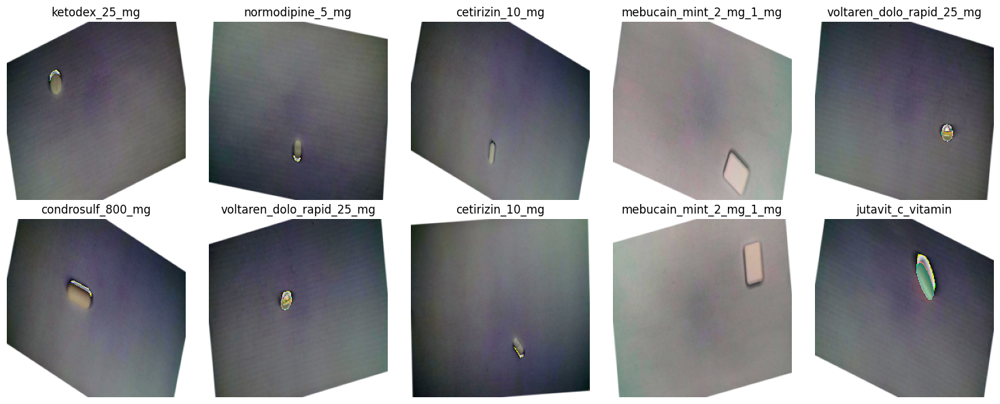

In [96]:
plt.figure(figsize=(15, 6))
for idx in range(10):
    image, label = train_dataset[idx]
    plt.subplot(2, 5, idx + 1)  # 2 строки, 5 столбцов
    plt.imshow(to_pil_image(image))
    plt.title(train_dataset.labels_dict[label])
    plt.axis('off')

plt.tight_layout()
plt.show()

# Этап 2
## Объявление модели
В ходе проекта было исследованы архитектуры:
- `mobile_net_v3_small`
- `efficientnet_v2_l`

Необходимое качество было достигнуто на 15 эпохах при исспользовании в качестве сверточного-блока преобученной сети `efficientnet_v2_l` (на ImageNet 1000), далее будет показан инференс именно этой модели.

Ниже приводится архитектура оригинальной `efficientnet_v2_l`

In [107]:
model = efficientnet_v2_l(weights="IMAGENET1K_V1")
print(model)

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  

---
В качестве классификатора предлагается использовать небольшой полносвязный блок из одного слоя, аналогичный тому, что используется в оргинальной нейросети.

In [108]:
model.classifier = nn.Sequential(
    nn.Dropout(p=0.4, inplace=True),
    nn.Linear(1280, len(labels_dict.keys()), bias=True),
)

print(model)

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  

---
Переносим модель на CUDA-устройство, если оно доступно в системе, для ускорения обучения.

Замораживаем сверточный блок `efficientnet_v2_l`, он не будет обучаться. Обучение будет происходить только полносвязного блока, определенного выше.

Таким образом количество параметров всего в нейросети будет 117 377 744

из них обучаемых параметров 143 472

In [109]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
print(f"Модель перенесена на девайс: {device}")
if torch.cuda.is_available():
  print(f"Девайс: {torch.cuda.get_device_name(0)}")
  
for param in model.parameters():
    param.requires_grad = False

for param in model.classifier.parameters():
    param.requires_grad = True

summary(model, input_size=(3, 224, 224), device=str(device))

Модель перенесена на девайс: cpu
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 112, 112]             864
       BatchNorm2d-2         [-1, 32, 112, 112]              64
              SiLU-3         [-1, 32, 112, 112]               0
            Conv2d-4         [-1, 32, 112, 112]           9,216
       BatchNorm2d-5         [-1, 32, 112, 112]              64
              SiLU-6         [-1, 32, 112, 112]               0
   StochasticDepth-7         [-1, 32, 112, 112]               0
       FusedMBConv-8         [-1, 32, 112, 112]               0
            Conv2d-9         [-1, 32, 112, 112]           9,216
      BatchNorm2d-10         [-1, 32, 112, 112]              64
             SiLU-11         [-1, 32, 112, 112]               0
  StochasticDepth-12         [-1, 32, 112, 112]               0
      FusedMBConv-13         [-1, 32, 112, 112]               0
      

---
Объявляем функцию потерь - кросс-энтропию

Объявляем оптимизатор 

In [110]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=0.001
)

---
Далее функция для обучения одной эпохи нейросети

Каждые 20 батчей выводит на экран кросс-энтропию на обучающей выборке

In [111]:
def train_one_epoch(epoch_index):
    running_loss = 0.
    last_loss = 0.

    for batch_index, data in enumerate(train_loader):
        # Извлечение батча
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)
        # Обнуление градиентов
        optimizer.zero_grad()
        # Прямое распространение
        outputs = model(inputs)
        # Подсчёт ошибки
        loss = criterion(outputs, labels)
        # Обратное распространение
        loss.backward()
        # Обновление весов
        optimizer.step()

        # Суммирование ошибки за последние 20 батчей
        running_loss += loss.item()
        if batch_index % 20 == 19:
            last_loss = running_loss / 20. # средняя ошибка за 20 батчей
            print(f'Эпоха: {epoch_index}, батч: {batch_index}, ошибка {last_loss}')
            running_loss = 0.

    return last_loss

# Этап 3
## Дообучение `efficientnet_v2_l`
Ниже представлен код для дообучения выбранной архитерктуры.

Для примера проводится обучения на одной эпохе.

Основной цикл обучения проходил на сервере с GPU Tesla T4.

В ходе обучения модели сохраняются на диск в конце эпохи, если на валидационной выборке удалось добиться сокращения ошибки.

In [114]:
EPOCHS = 1

best_vloss = 1e5

for epoch in range(EPOCHS):
    print(f'Эпоха {epoch}')

    # Перевод модели в режим обучения
    model.train(True)
    # Эпоха обучения
    avg_loss = train_one_epoch(epoch)

    # Перевод модели в режим валидации
    model.eval()
    running_vloss = 0.0

    # Валидация
    with torch.no_grad():
        for i, vdata in enumerate(val_loader):
            vinputs, vlabels = vdata
            vinputs, vlabels = vinputs.to(device), vlabels.to(device)
            voutputs = model(vinputs)
            vloss = criterion(voutputs, vlabels)
            running_vloss += vloss.item()

    avg_vloss = running_vloss / (i + 1)

    # # Сохранение лучшей модели
    # if avg_vloss < best_vloss:
    #     best_vloss = avg_vloss
    #     model_path = f'models/color_classifier_{epoch}.pt'
    #     torch.save(model.state_dict(), model_path)

    print(f'В конце эпохи ошибка train {avg_loss}, ошибка val {avg_vloss}')

Эпоха 0
Эпоха: 0, батч: 19, ошибка 5.0675925493240355
Эпоха: 0, батч: 39, ошибка 4.558855772018433
Эпоха: 0, батч: 59, ошибка 4.22224452495575
Эпоха: 0, батч: 79, ошибка 4.014310908317566
В конце эпохи ошибка train 4.014310908317566, ошибка val 3.319554885228475


---
Лучшего качества удалось добиться на 15 эпохе (из 15) дообучения.

Обучение заняло порядка 45 минут.

Вот команда для загрузки файла с state_dict модели с сервера на локальную машину.

In [ ]:
!scp ubuntu@213.165.209.68:project/models/efficientnet_v2_l/classifier_14.pt /Users/emc2/Проекты/личное/Практикум/Deep\ learning\ Engineer/dle_practicum/Sprint\ 3/project/models/efficientnet_v2_l/

classifier_14.pt                              100%  450MB   7.0MB/s   01:04    


# Этап 4
## Оценка качества
- Загрузка labels_dict из файла
- Объявление валидационного датасета
- Объявление модели и переопределение классификатора в модели

In [7]:
with open("labels_dict.pickle", "rb") as f:
    labels_dict = pickle.load(f)

val_path = "data/ogyeiv2/ogyeiv2/ogyeiv2/valid/images"
val_dataset = ogyeiv2_dataset(val_path, test_transforms, labels_dict)
val_loader = val_dataset.get_dataloader(
    shuffle=False,
    batch_size=32,
)


model = efficientnet_v2_l(weights="IMAGENET1K_V1")
model.classifier = nn.Sequential(
    nn.Dropout(p=0.4, inplace=True),
    nn.Linear(1280, len(labels_dict.keys()), bias=True),
)
print(model)

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
      )
      (1): FusedMBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  

---
Загрузка модели, полученной с сервера

In [8]:
model.load_state_dict(torch.load(
    "models/efficientnet_v2_l/classifier_14.pt",
    weights_only=True,
    map_location=torch.device('cpu')
))

<All keys matched successfully>

---
Оценка качества модели на валидационной выборке.

Видно что на 112 классах удалось добавить accuracy 0.78 (выше целевой 0.75).

In [100]:
labels_predicted = []
labels_true = []

model.eval()

with torch.no_grad():
    for data in tqdm(val_loader):
        images, labels = data

        outputs = model(images)
        # argmax по всем примерам, так как torch.max возвращает два параметра
        # максимальные значения в выборке и позиции, на которых они находятся (argmax)
        _, predicted = torch.max(outputs, 1) # argmax по всем примерам
        labels_predicted.extend(predicted.numpy())
        labels_true.extend(labels.numpy())

print(classification_report(labels_true, labels_predicted, target_names=labels_dict.values()))

100%|██████████| 21/21 [05:44<00:00, 16.38s/it]

                                  precision    recall  f1-score   support

       doxazosin_sandoz_uro_4_mg       0.83      0.83      0.83         6
                   dulodet_60_mg       1.00      0.50      0.67         6
            nurofen_forte_400_mg       0.71      0.83      0.77         6
                      milgamma_n       1.00      0.83      0.91         6
                 controloc_20_mg       1.00      1.00      1.00         6
                  dulsevia_60_mg       0.67      1.00      0.80         6
                     novo_c_plus       0.60      1.00      0.75         6
    vitamin_d3_fresenius_1000_ne       0.83      0.83      0.83         6
                    jutavit_cink       0.60      0.50      0.55         6
                      neo_citran       1.00      1.00      1.00         6
                  enterol_250_mg       1.00      0.83      0.91         6
           algoflex_rapid_400_mg       1.00      0.83      0.91         6
                 rubophen_500_mg     


/Users/emc2/.pyenv/versions/3.12.12/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/emc2/.pyenv/versions/3.12.12/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/emc2/.pyenv/versions/3.12.12/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

---
Аналогичная проверка на тестовой выборке

In [9]:
test_path = "data/ogyeiv2/ogyeiv2/ogyeiv2/test/images"
test_dataset = ogyeiv2_dataset(test_path, test_transforms, labels_dict)
test_loader = test_dataset.get_dataloader(
    shuffle=False,
    batch_size=32,
)

labels_predicted = []
labels_true = []

model.eval()

with torch.no_grad():
    for data in tqdm(test_loader):
        images, labels = data

        outputs = model(images)
        # argmax по всем примерам, так как torch.max возвращает два параметра
        # максимальные значения в выборке и позиции, на которых они находятся (argmax)
        _, predicted = torch.max(outputs, 1) # argmax по всем примерам
        labels_predicted.extend(predicted.numpy())
        labels_true.extend(labels.numpy())

print(classification_report(labels_true, labels_predicted, target_names=labels_dict.values()))

100%|██████████| 21/21 [05:38<00:00, 16.11s/it]

                                  precision    recall  f1-score   support

       doxazosin_sandoz_uro_4_mg       0.80      0.67      0.73         6
                   dulodet_60_mg       0.60      0.50      0.55         6
            nurofen_forte_400_mg       0.50      1.00      0.67         6
                      milgamma_n       0.67      0.67      0.67         6
                 controloc_20_mg       1.00      1.00      1.00         6
                  dulsevia_60_mg       0.57      0.67      0.62         6
                     novo_c_plus       0.75      1.00      0.86         6
    vitamin_d3_fresenius_1000_ne       1.00      1.00      1.00         6
                    jutavit_cink       1.00      0.33      0.50         6
                      neo_citran       1.00      1.00      1.00         6
                  enterol_250_mg       0.83      0.83      0.83         6
           algoflex_rapid_400_mg       1.00      1.00      1.00         6
                 rubophen_500_mg     


/Users/emc2/.pyenv/versions/3.12.12/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/emc2/.pyenv/versions/3.12.12/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/emc2/.pyenv/versions/3.12.12/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metr

---
Теперь проведем исследование результатов и ответим на вопросы из задания
1. На каких 5 классах модель ошибается чаще всего?
1. Почему модель может ошибаться на этих классах?
1. На каких классах модель не совершает ошибок?
1. Почему эти классы модель распознаёт безошибочно?
1. Как можно улучшить точность классификатора?
1. Как ещё можно проанализировать результаты и ошибки модели?

---
> На каких 5 классах модель ошибается чаще всего?

Ниже приведены наименования лекарств, где доля ошибок наибольшая

In [10]:
cm = confusion_matrix(labels_true, labels_predicted)
error_rate = 1 - np.diag(cm)[cm.sum(axis=1) > 0] / cm.sum(axis=1)[cm.sum(axis=1) > 0]

classification_data = pd.DataFrame()
classification_data["error_rate"] = error_rate
classification_data["label"] = labels_dict.values()

classification_data.sort_values("error_rate", ascending=False).head(5)

,error_rate,label
111,1.000000,teva_ambrobene_30_mg
106,1.000000,sirdalud_4_mg
46,1.000000,naturland_d_vitamin_forte
87,1.000000,escitil_10_mg
34,0.833333,nebivolol_sandoz_5_mg


---
> Почему модель может ошибаться на этих классах?

Гипотеза: таблетки похожи друг на друга.

Посмотрим на некоторые примеры, где модель больше всего ошибается. Выведем изображения для класса teva_ambrobene_30_mg (id 111) и классы, с которыми модель его путает

In [27]:
labels = pd.DataFrame()
labels["labels_predicted"] = labels_predicted
labels["labels_true"] = labels_true

labels[labels["labels_true"] == 111]


,labels_predicted,labels_true
47,39,111
126,24,111
149,38,111
188,13,111
239,13,111
291,38,111


In [29]:
identity_transforms = test_transforms = Compose([
    # Resize((224, 224)),
    ToTensor(),
    # Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

test_path = "data/ogyeiv2/ogyeiv2/ogyeiv2/test/images"
test_dataset = ogyeiv2_dataset(test_path, identity_transforms, labels_dict)

labels_to_research = [111, 39, 24, 38, 13]
images_to_reasearch = dict()
for image, label in test_dataset:
    if label in labels_to_research:
        if label not in images_to_reasearch:
            images_to_reasearch[label] = [image]
        else:
            images_to_reasearch[label].append(image)

def plot_images(label):
        print(labels_dict[label])
        idx = 0
        plt.figure(figsize=(10, 12))
        for image in images_to_reasearch[label]:
                idx += 1
                plt.subplot(3, 2, idx)
                plt.imshow(to_pil_image(image))
                plt.title(train_dataset.labels_dict[label])
                plt.axis('off')
        plt.tight_layout()
        plt.show()

---
Выведем изображения as is без аугментации

teva_ambrobene_30_mg


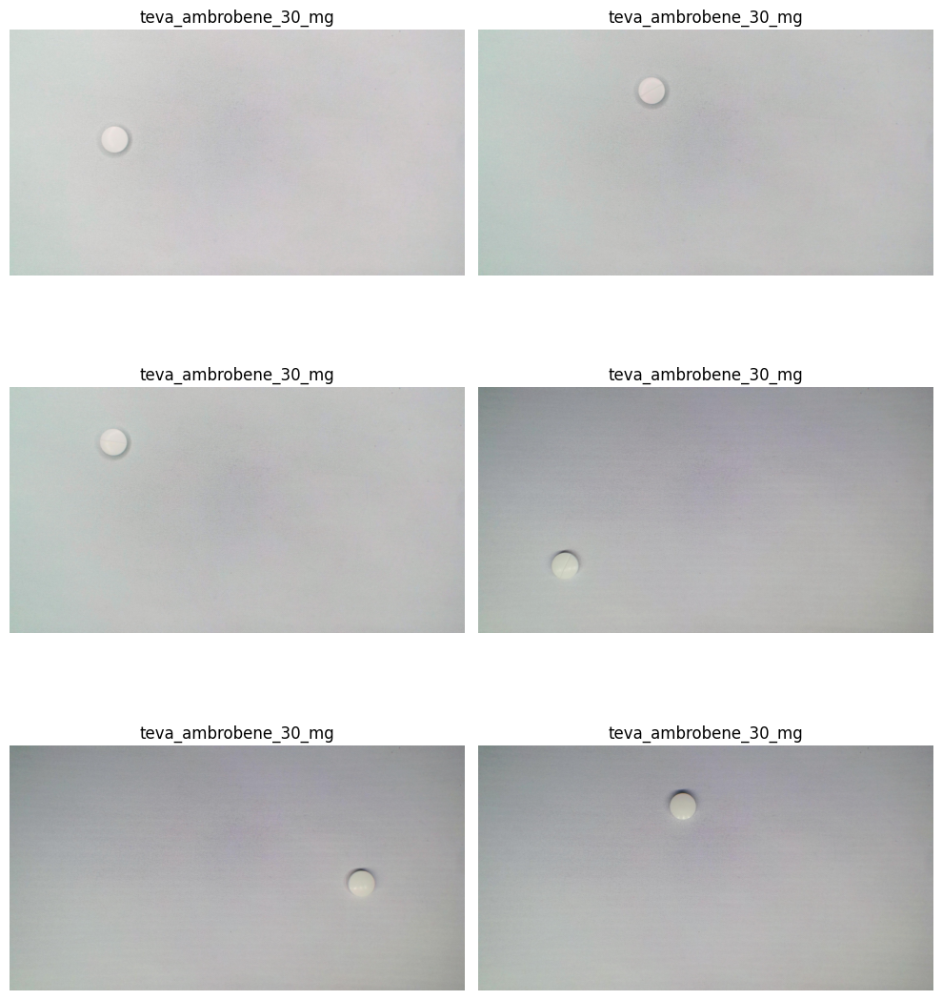

atorvastatin_teva_20_mg


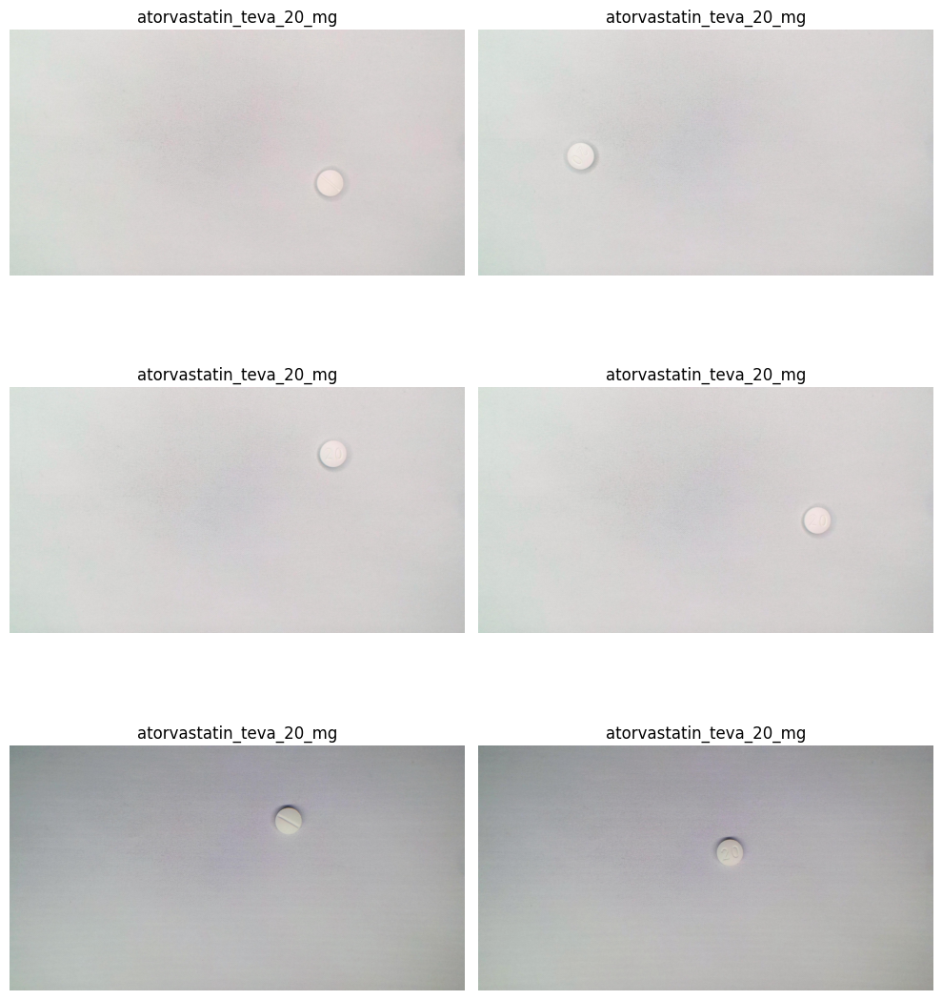

ketodex_25_mg


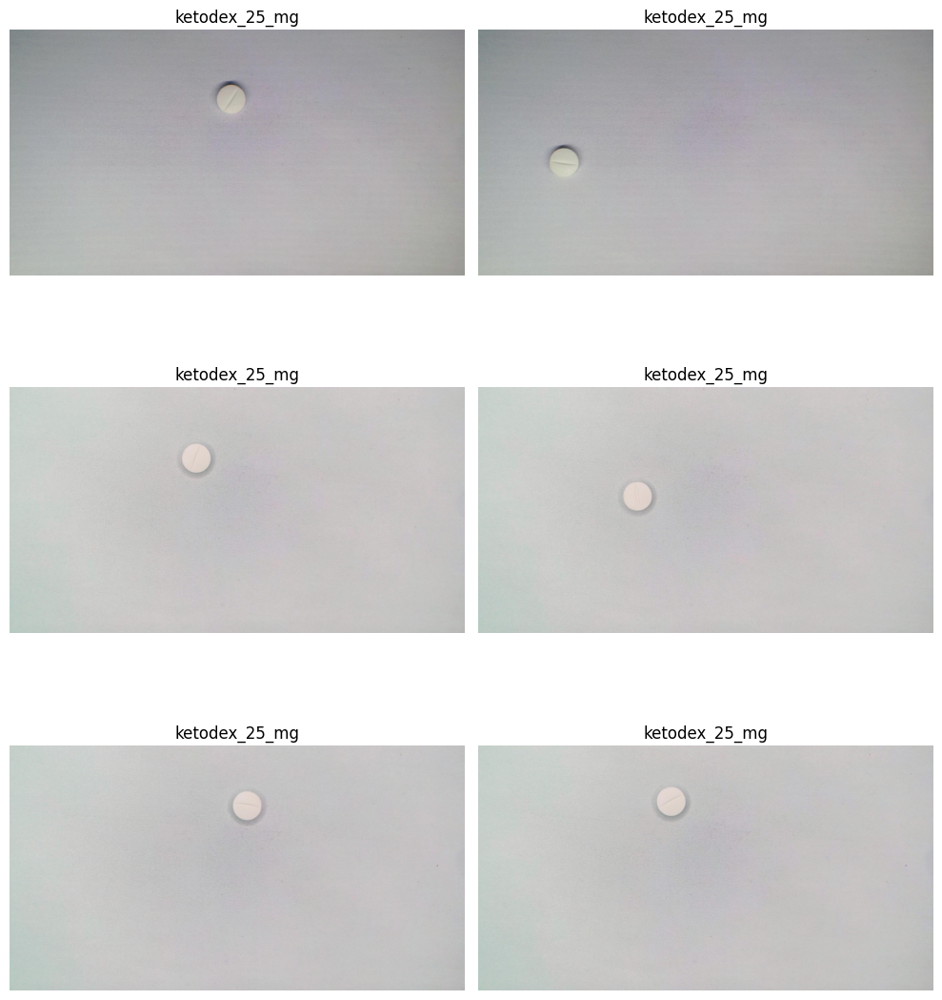

narva_sr_1_5_mg_retard


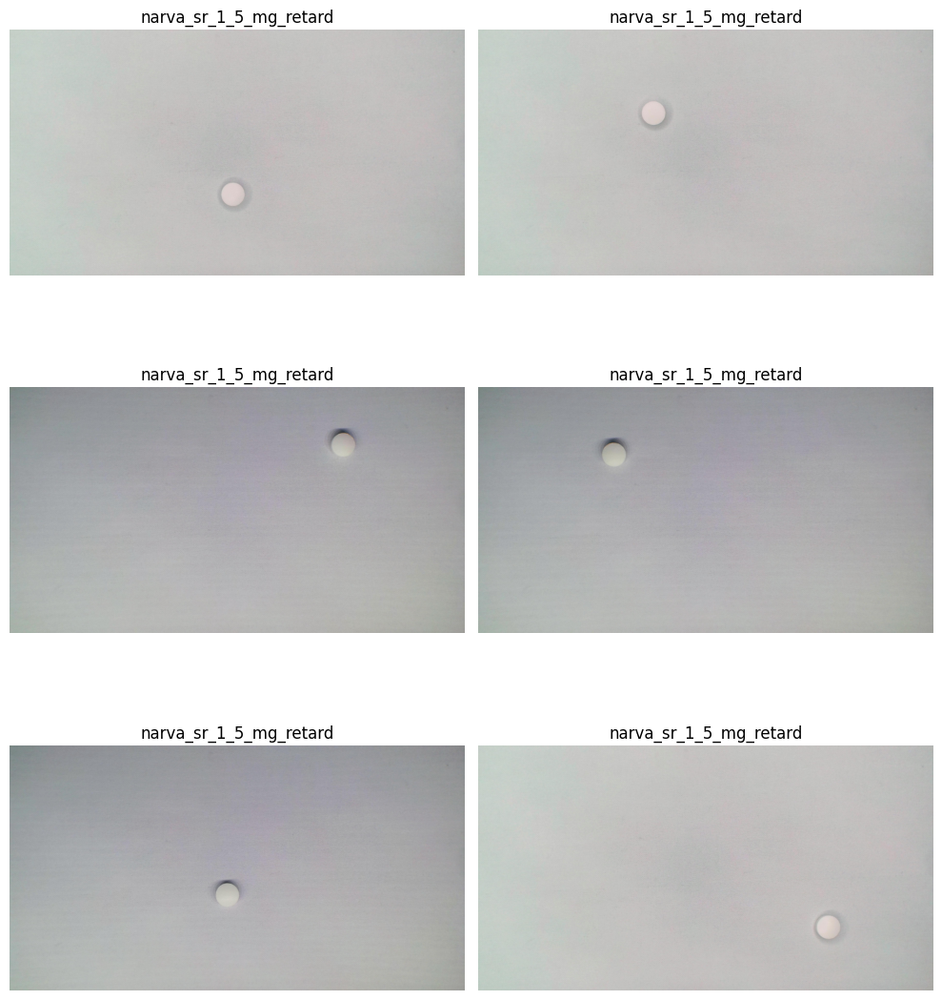

milurit_300_mg


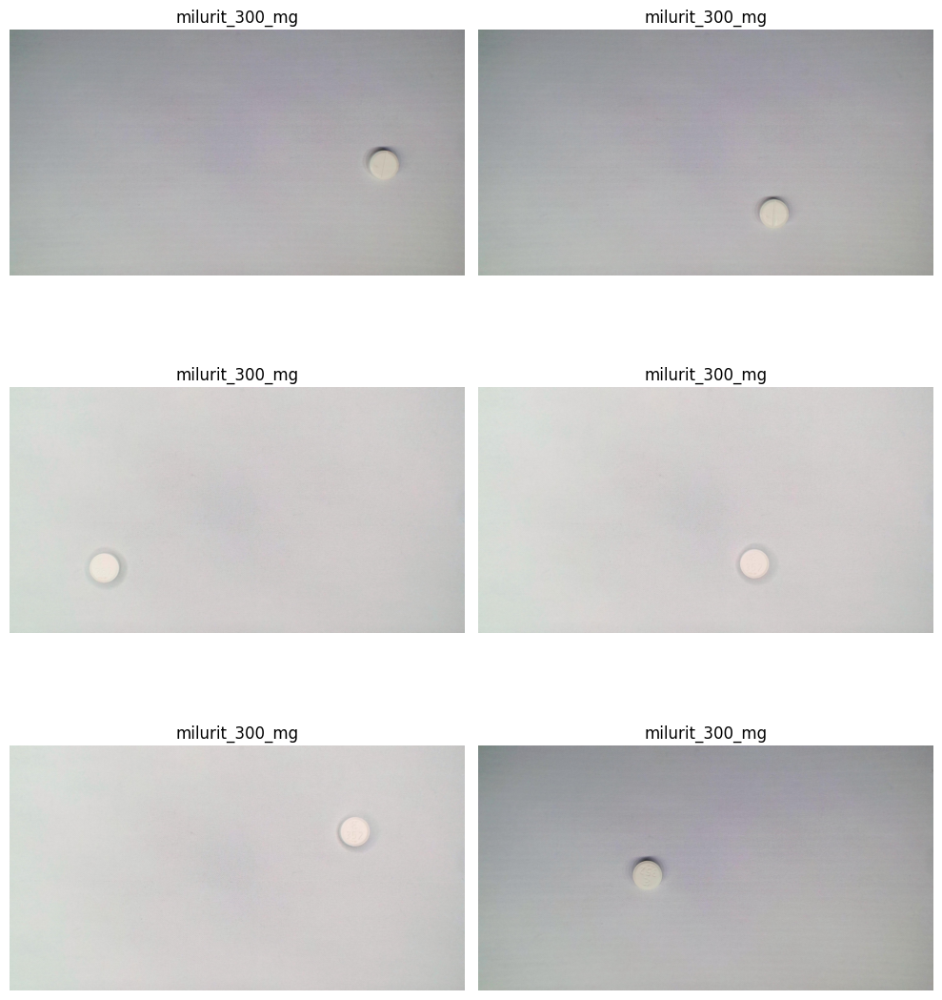

In [ ]:
for label in labels_to_research:
        plot_images(label)

---
Действительно, таблетки очень похожи. Их сложно визуально отличить друг от друга

Проверим ещё одну таблетку

In [37]:
labels = pd.DataFrame()
labels["labels_predicted"] = labels_predicted
labels["labels_true"] = labels_true

labels[labels["labels_true"] == 87]


,labels_predicted,labels_true
24,107,87
49,107,87
83,107,87
125,107,87
244,73,87
551,37,87


In [38]:
labels_to_research = [87, 107, 73, 37]
images_to_reasearch = dict()
for image, label in test_dataset:
    if label in labels_to_research:
        if label not in images_to_reasearch:
            images_to_reasearch[label] = [image]
        else:
            images_to_reasearch[label].append(image)

escitil_10_mg


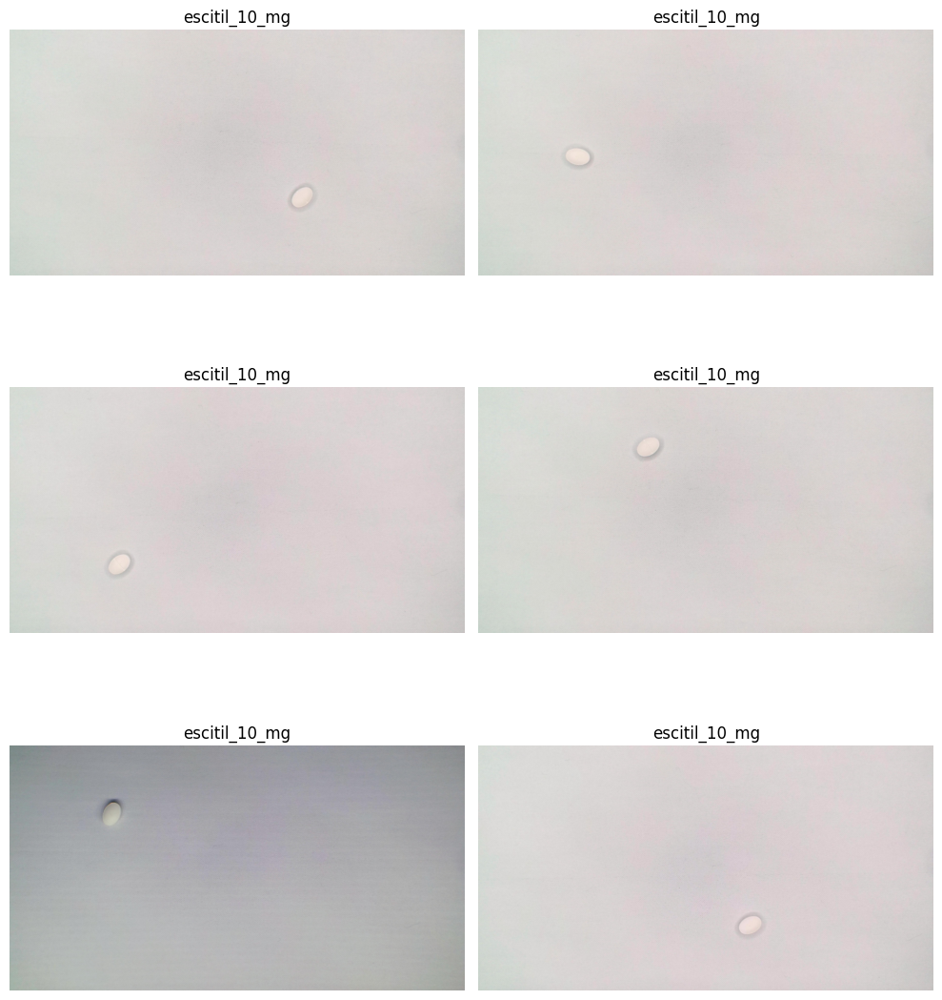

frontin_0_25_mg


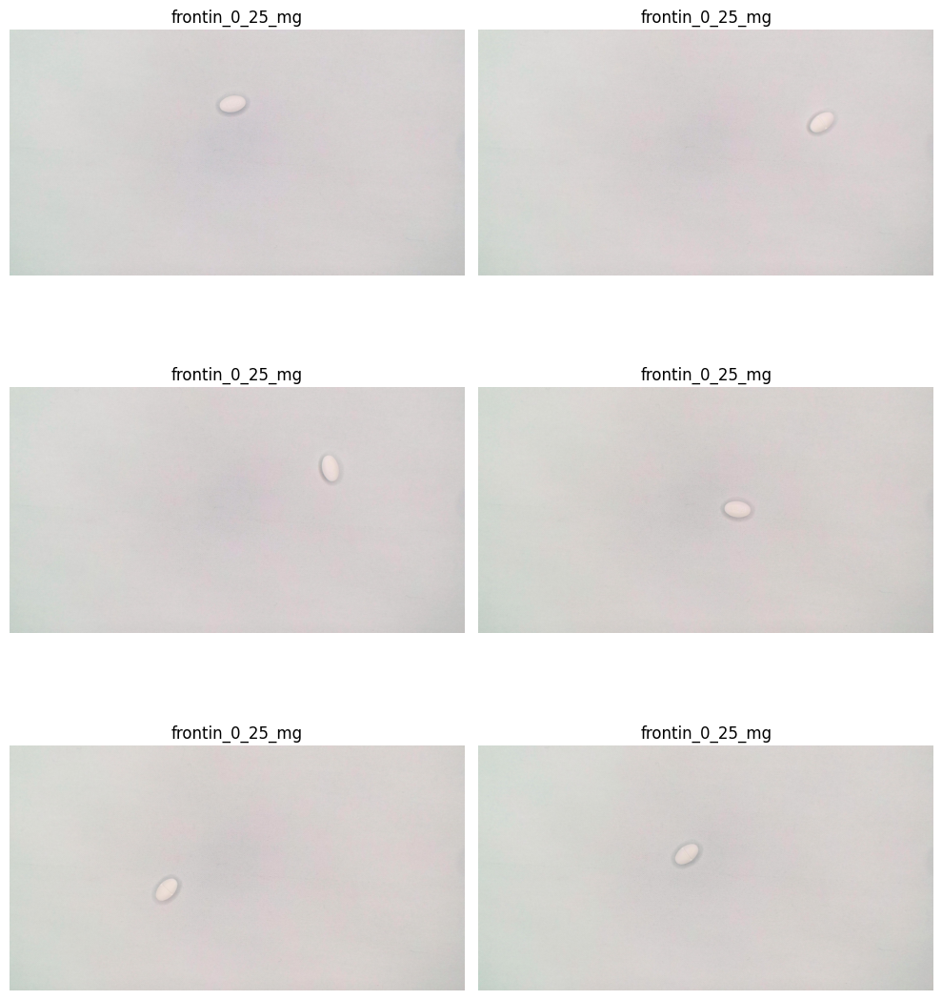

doxazosin_hexal_4_mg


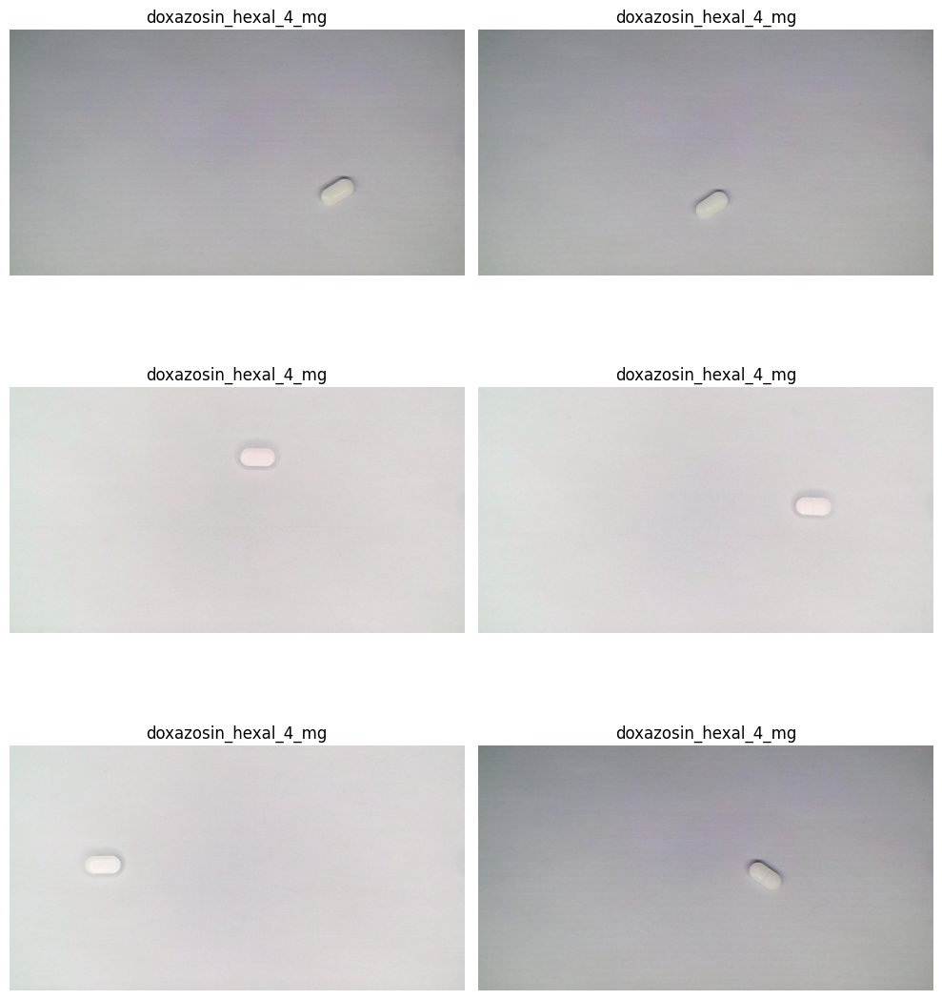

furon_40_mg


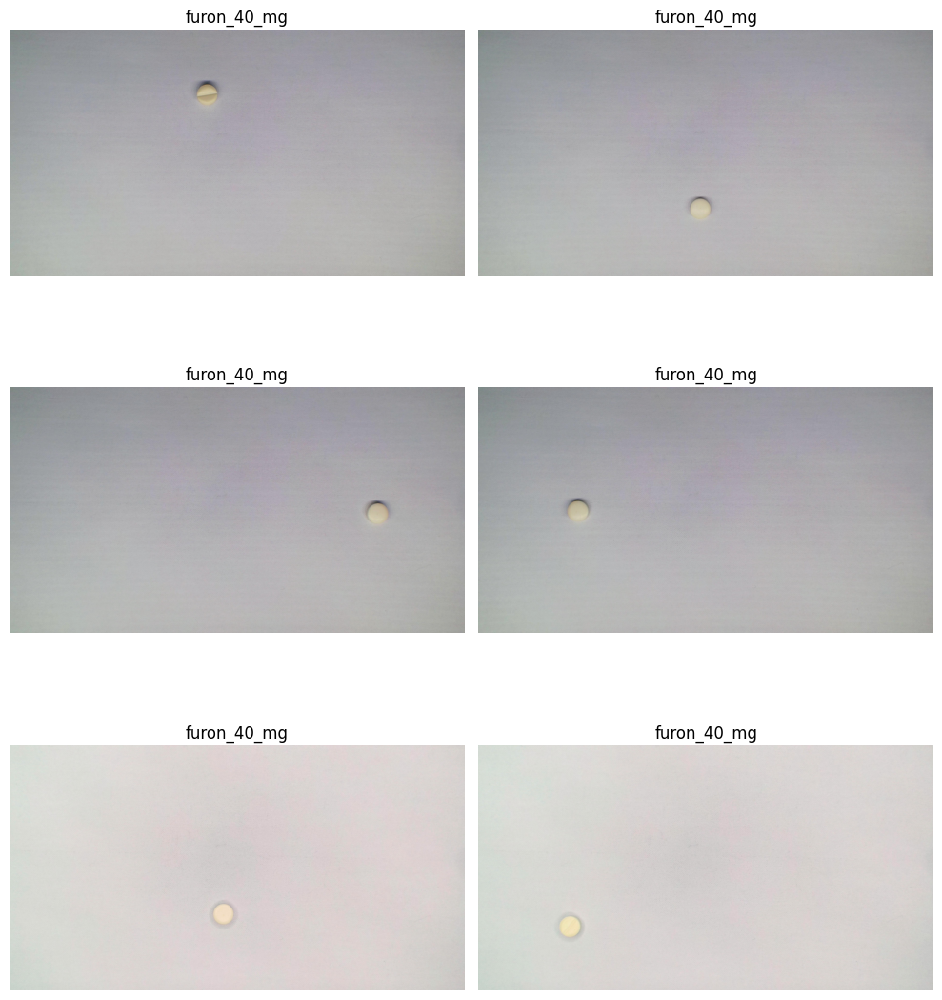

In [39]:
for label in labels_to_research:
        plot_images(label)

---
И тут гипотеза скорее подтверждается. escitil_10_mg продолговатой формы, которая напоминает таблетки frontin_0_25_mg и капсулы doxazosin_hexal_4_mg.

Однако модель один раз спутала её с furon_40_mg - желтоватой круглой таблеткой. Тут можно глубже поисследовать причину. Предположу, что могли повлиять условия съемки этих таблеток на изображениях в обучающей выборке, например слегка другой фон, схожий у этих таблеток и отличный от других. Схожие условиях освещения, разрешение снимков и др.

Подозреваю, что намного более лучших результатов можно было бы добиться, если сначала сделать детекцию таблетки, вырезать её и подавать картинку с бОльшим разрешением в нейросеть.

---
> На каких классах модель не совершает ошибок?

Судя по тестовой выборке, таких таблеток почти половина датасета - 53 шт

In [44]:
classification_data[classification_data["error_rate"] == 0]

,error_rate,label
2,0.0,nurofen_forte_400_mg
4,0.0,controloc_20_mg
6,0.0,novo_c_plus
7,0.0,vitamin_d3_fresenius_1000_ne
9,0.0,neo_citran
11,0.0,algoflex_rapid_400_mg
15,0.0,cataflam_dolo_25_mg
19,0.0,aspirin_ultra_500_mg
22,0.0,salazopyrin_en_500_mg
23,0.0,lactiv_plus


---
> Почему эти классы модель распознаёт безошибочно?

Гипотеза: по аналогии с топом ошибок предположу, что классы тривиальные, имеют уникальные отличительные особенности (размер, цвет, форма, текстура), которые модель легко связывает с конкретным лекарством.

Посмотрим на фото нескольких таких лекарств в тестовой выборке

In [45]:
labels_to_research = [99, 101, 102, 109, 110]
images_to_reasearch = dict()
for image, label in test_dataset:
    if label in labels_to_research:
        if label not in images_to_reasearch:
            images_to_reasearch[label] = [image]
        else:
            images_to_reasearch[label].append(image)

def plot_images(label):
        print(labels_dict[label])
        idx = 0
        plt.figure(figsize=(10, 12))
        for image in images_to_reasearch[label]:
                idx += 1
                plt.subplot(3, 2, idx)
                plt.imshow(to_pil_image(image))
                plt.title(train_dataset.labels_dict[label])
                plt.axis('off')
        plt.tight_layout()
        plt.show()

lactamed


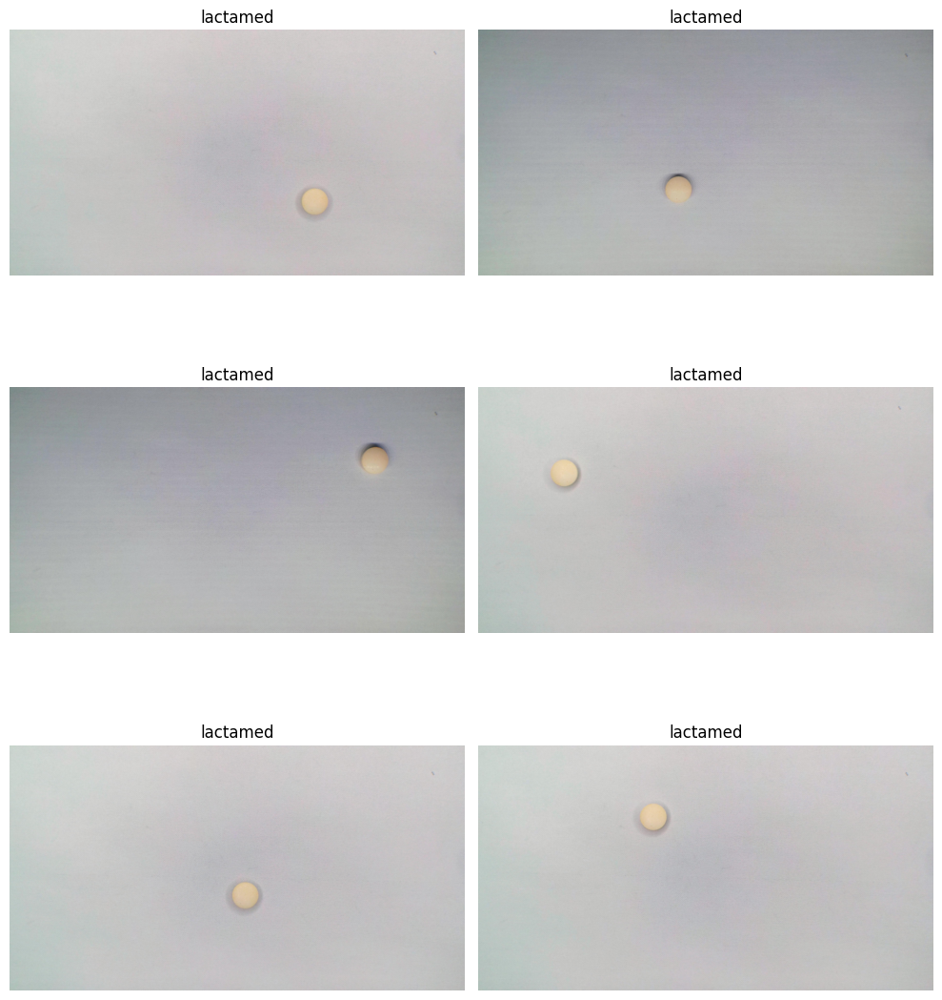

coverex_4_mg


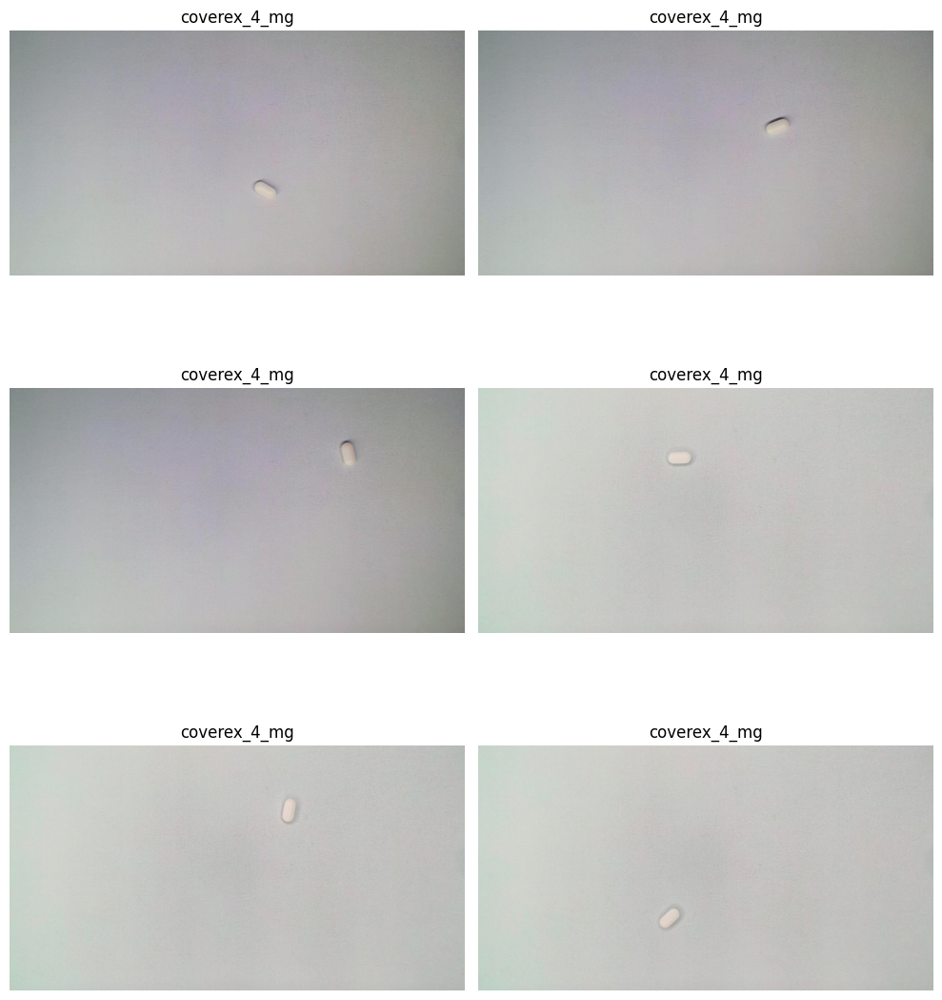

merckformin_xr_1000_mg


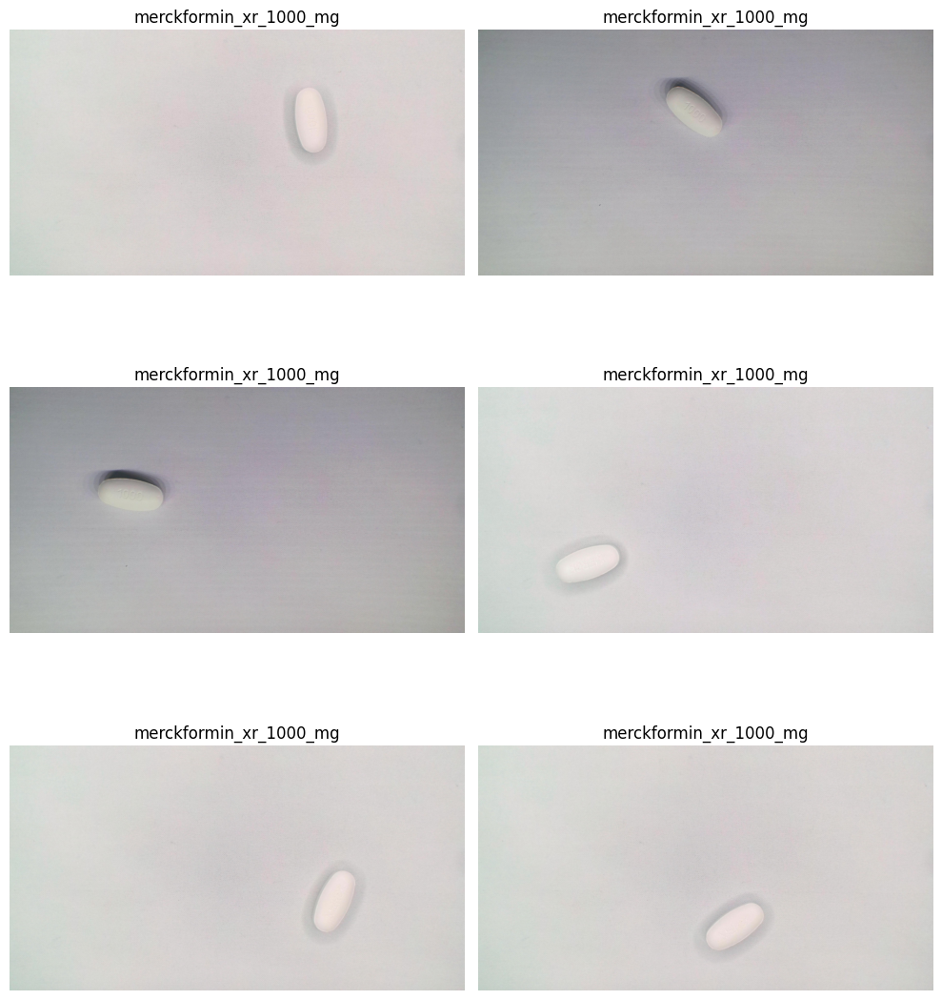

valeriana_teva


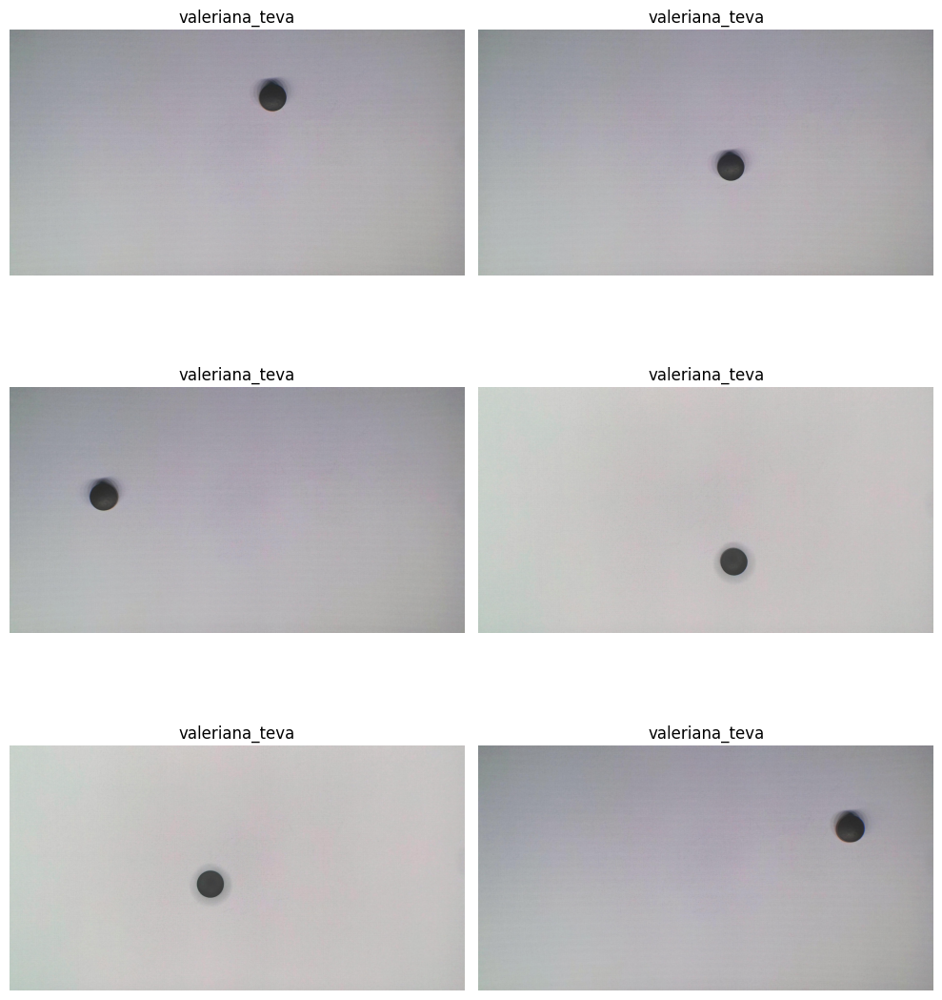

urotrin


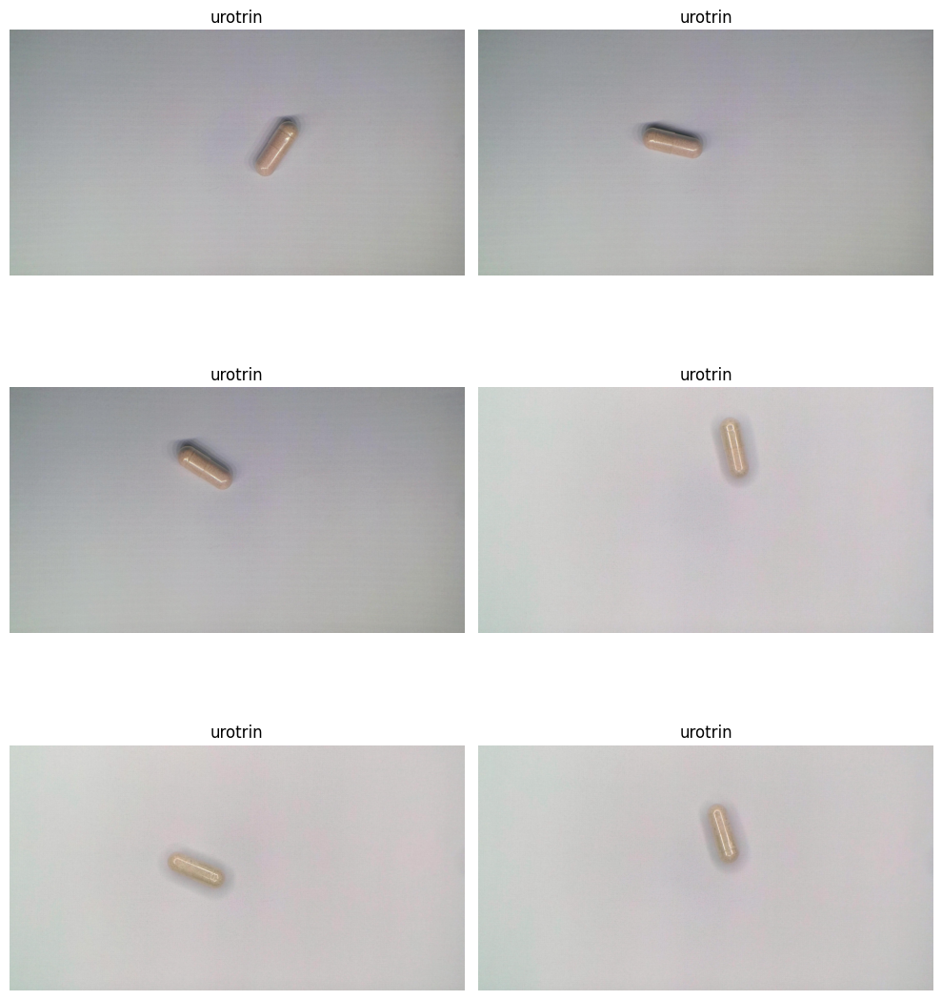

In [46]:
for label in labels_to_research:
    plot_images(label)

Каждая таблетка в выборке выглядит довольно уникальной:
- lactamed - бежевая круглая среднего размера
- coverex_4_mg - маленькая продолговатая
- merckformin_xr_1000_mg - очень большая
- valeriana_teva - черная
- urotrin - коричневая капсула

Эти таблетки имеют уникальные характеристики, которые модель легко выучила и использует для безошибочной классификации

---
> Как можно улучшить точность классификатора?

Общее:
- больше данных в обучающей выборке, с большим разнообразием - ракурсами, фонами, освещением
- больше слоев в классификаторе, но с большим контролем за оверфитом - батч-нормализация, дропаут, нормализация, клиппинг градиентов
- заменить нейросетевой классификатор классическим поверх сверточного блока, например градиентный бустинг или random forest

Частное:
- детектировать таблетку на снимке и не сжимать весь снимок к 224 пикселям, а вырезать из исходного изображения эти 224 пикселя
- использовать несколько снимков с разных ракурсов и сторон (видно что некоторые таблетки на лицевой части имеют уникальные маркировки)
- вырезать фон, чтобы исключить влияние этого "шума" на результаты детекции

---
> Как ещё можно проанализировать результаты и ошибки модели?

- Отобрать все примеры, где модель ошибается, кластеризовать их по фичам сверточного блока и отсматривать кластеры, чтобы выявить что их объединяет. Например можно найти проблемы с освещением, фокусом, фоном и другие обшие признаки, приводящие к ошибкам
- Ablation study. Исследование влияния фичей с целью получения их интерпретации и оценки вклада в результат. Методы: SHAP, LIME, Grad-CAM.
- Исследовать "уверенность" модели - распределения логитов последнего слоя. Использовать эту информацию для уточнения результатов классификации, например стакинг другой модели (например, catboost) поверх сверточного и полносвязного слоев